# Исследование рынка заведений общественного питания Москвы

Презентация к проекту: <https://disk.yandex.ru/d/Fr2d8Imk_lgl2Q>

Инвесторы из фонда «Shut Up and Take My Money» хотят попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель работы:** Необходимо провести исследование, что бы разобраться с категорией и концепцией заведения, которое планирует открыть заказчик, а также определить в каком районе стоит его открыть.

**Ход работы:**
1. Изучение данных и проведение их предобработки;
2. Проведение анализа имеющейся информации по заведениям;
3. Визуализация всех рассматриваемых закономерностей;
4. Рассмотрение возможности открытия кофейни;
5. Подготовка презентации.

## Шаг 1. Изучение общей информации в файле с данными

Подключение библиотек и загрузка данных для начала исследования

In [1]:
# подключение библиотек
!pip install folium
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
import numpy as np
import math as mth
import json
import plotly.express as px
from datetime import datetime as dt
from scipy import stats as st
from plotly import graph_objects as go
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster

In [2]:
#подгрузка файлов с данными
try:
    data = pd.read_csv('C:/Users/Tata_P/Downloads/moscow_places.csv', sep = ',')
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson' 
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv', sep = ',')
    state_geo = 'datasets/admin_level_geomap.geojson'
warnings.filterwarnings('ignore')

In [3]:
data.head(5) # вывод DF для ознакомления с данными и структурой

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Таблица `data` содержит столбцы с информацией о заведениях общественного питания в разных районах Москвы: 
- `name` — название заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `address` — адрес заведения;
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` —  категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- `middle_coffee_cup` —  число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `seats` —  количество посадочных мест.

In [4]:
data.info() #просмотр информации

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print('Количество заведений в списке:', data['name'].count())
print('Количество уникальных названий:', data['name'].nunique())

Количество заведений в списке: 8406
Количество уникальных названий: 5614


Рассмотрев информацию о файле с данными, можно сделать вывод:
- наименование столбцов записаны в нижнем регистре и отражают суть содержимого, поэтому заменять нет необходимости;
- в файле много пропусков (а именно в `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`), как специальных из-за различных категорий заведений и их ценообразований, так, вероятно, и из-за ошибок, например в столбце `hours`, содержащий режим работы. Данный пункт рассмотрим и проверим на следующем шаге;
- тип данных float64 можно заменить на int64 в столбце `seats`, в котором указано количество посадочных мест, так как эта величина всегда целочисленная;  
- количество заведений в файле 8406, а уникальных - 5614. Это говорит о том, что, вероятно, в списке заведений есть либо дубликаты, либо сетевые заведения. 

### Шаг 2. Подготовка и предобработка данных.

#### Проверка данных на пропуски и дубликаты.

In [6]:
data.isna().sum() #количество пропусков

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
pd.DataFrame(round(data.isna().mean()*100)).style.background_gradient('coolwarm') # расчет количесвта пропусков в %

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Количество пропусков довольно большое. Заранее знаем,что специальные пропуски задержатся в столбцах `middle_avg_bill` и `middle_coffee_cup`, так как:
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
** Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
** Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
** Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
** Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
** Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
** Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.


Пропусков в столбце с указанием режима работы заведения `hours` довольно немного относительно других столбцов, 6%. Такие пропуски можно заполнить с помощью поиска информации о заведениях по их адресам в открытых источниках. Но в рамках данного исследования принято решение такие пропуски оставить, так как имеющегося объема выборки достаточно для проведения исследования.

Более 50% пропусков, от общего числа заполненных строк, находится в столбцах `price`, `avg_bill`. Информацию по категории цен в заведениях заполнить можно исключительно вручную с помощью найденных значений в открытых источниках, но обработать такое количество - потеря драгоценного времени. Заполнив эти пропуски медианой могут исказить результаты исследования.

 Принято решение не удалять и не заполнять пропуски и проводить анализ дальше.

Проверим данные на выбросы

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


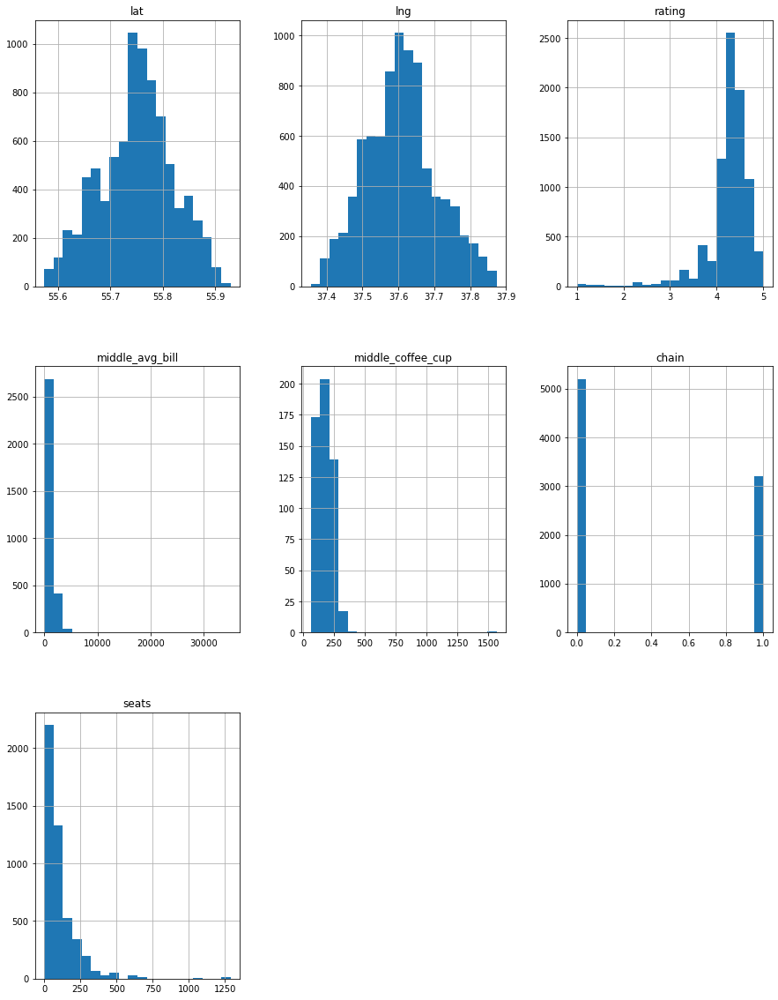

In [8]:
data.hist(figsize=(15, 20), bins=20); 
# вывод гистограмм по каждому столбцу для первичной оценки характера распределения значений
data.describe()

В столбцах DF есть некоторые сомнительные значения максимумов. Посмотрим что из себя представляют заведения имеющие такие значения.

In [9]:
display(data.query('middle_coffee_cup == 1568'))
print()
display(data.query('seats == 1288').sort_values(by = 'address', ascending = False))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0
6838,Alternative coffee,кофейня,"Москва, проспект Вернадского, 41, стр. 1",Западный административный округ,"пн-пт 09:00–21:00; сб,вс 09:00–22:00",55.673128,37.502992,4.3,NaN,NaN,NaN,NaN,0,1288.0
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0


Максимум по стоимости одной чашки капучино есть только у одного заведения - Шоколадница. Большая вероятность того, что это просто ошибка.

Довольно интересно получилось, что выявлении заведений, обладающих посадочными местами на 1288 человека. Все места общественного питания, в которых зафиксирован максимум по посадочным местам, находятся в районе м.Юго-Западная и все на Проспекте Вернадского. Кроме того, есть заведения, находящиеся по одному адресу. Возможно, это техническая ошибка или же данные заведения имеют общую зону посадки. 

В рамках данного исследования принято решение пренебречь и оставить найденные закономерности и выбросы, так как на ход исследования это мало можно повлиять. 

Проверим DF на дубликаты

In [10]:
print('Количество дублирующихся строк:', data.duplicated().sum()) # количество дубикатов

Количество дублирующихся строк: 0


Явных дубликатов в предоставленном файле с информацией о заведениях нет

Для поиска неявных дубликатов, в первую очередь преобразуем знаки внутри названий заведений.

In [11]:
data['name'] = data['name'].str.upper().replace({' - ': '-', '   ': ' ', '  ': ' ',' & ':'&'})

In [12]:
display(data[data.duplicated(['name', 'address'])]) #вывод дублей

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Принято решение удалить найденные неявные дубликаты, хотя их всего 3 из более 8 тысяч заведений.

In [13]:
data= data.drop(index=[1511, 2420, 3109]).reset_index(drop=True) #удаение строк и сброс индекса
display(data[data.duplicated(['name', 'address'])]) #вывод дублей для проверки удаления

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


#### Добавление новых столбцов

Для рассмотрения местоположения заведений и их режима работы, выделим в отдельные столбцы улицы и наличие ежедневного и круглосуточного режима.

In [14]:
#функция для выделения из ячейки улицы 
def street(value):
    exp_split = value.split(sep=', ')[1]
    return exp_split

In [15]:
data['street'] = data['address'].apply(street) #добаление нового столбца
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [16]:
print (data['hours'].unique()) #просмотр уникальных значений в режимах

['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']


In [17]:
# столбец с заведениями, которые работают ежедневно и круглосуточно
data_hours = data[data['hours'].notna()]
data['is_24_7'] = data_hours['hours'].str.contains('ежедневно, круглосуточно')
# в тех данных, в которых пропуски, по умолчанию укажу, что таковыми не являются
data['is_24_7'] = data['is_24_7'].fillna(False)

In [18]:
display(data.head()) #проверка записи новых столбцов в DF

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [19]:
print('Количество круглосуточных магазинов и магазинов, работающих ежедневно:', data.query('is_24_7 == True')['name'].count())
print('Процент таких заведений:', '{0:.2%}'.format((data.query('is_24_7 == True')['name'].count())/(data['name'].count())))


Количество круглосуточных магазинов и магазинов, работающих ежедневно: 730
Процент таких заведений: 8.69%


Всего 730 заведений из более чем 8000 работают ежедневно и круглосуточно. Это только около 9% от общего числа.

**Вывод:** После рассмотрения структуры и содержания предоставленного DF было принято решение не проводить замену пропусков, имеющуюся в столбцах. Для дальнейшего анализа были добавлены новые столбцы, которые помогут определить местоположение заведений и их режим работы.

### Шаг 3. Анализ данных

#### Категории заведений и их количество

In [20]:
print(data['category'].unique()) #вывод уникальных значений в столбце с категориями

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [21]:
#определение количества заведений в каждой категории
data_category = data.groupby('category')['name'].count().reset_index().sort_values(by = 'name', ascending = False).rename(columns={'name':'counts'})
data_category['ratio'] = (data_category['counts'] / data['name'].count())*100
display(data_category)

,category,counts,ratio
3,кафе,2377,28.287516
6,ресторан,2042,24.300845
4,кофейня,1413,16.815423
0,"бар,паб",764,9.091991
5,пиццерия,633,7.533024
2,быстрое питание,603,7.176009
7,столовая,315,3.748661
1,булочная,256,3.046531


In [22]:
# поспроение круговой диаграммы для быстрого визуьного восприятия лидирующих категорий
fig = go.Figure(data=[go.Pie(labels= data_category['category'], # указываем значения, которые появятся на метках сегментов
                             values= data_category['counts'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество заведений в каждой категории', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

На исследование представлено 8 категорий заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, заведения быстрого питания, булочная, столовая. При подсчете количества заведений в каждой категории, оказалось, что большее число заведений - это кафе и рестораны. Третье место по количеству занимают кофейни.

#### Количество посадочных мест в заведениях каждой категории.

Во избежание искажение результатов из-за выбросов, найдем для каждой категории медиану посадочных мест

In [23]:
#определение количества посадочных мест
for category in data['category'].unique():
    print('Среднее количество посадочных мест в заведениях {}:{}.'. format(category, int(data.query('category in @category')['seats'].median())))

Среднее количество посадочных мест в заведениях кафе:60.
Среднее количество посадочных мест в заведениях ресторан:86.
Среднее количество посадочных мест в заведениях кофейня:80.
Среднее количество посадочных мест в заведениях пиццерия:55.
Среднее количество посадочных мест в заведениях бар,паб:82.
Среднее количество посадочных мест в заведениях быстрое питание:65.
Среднее количество посадочных мест в заведениях булочная:50.
Среднее количество посадочных мест в заведениях столовая:75.


In [24]:
#группировка для визуализации
data_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by = 'seats', ascending = False)
data_seats['seats'] = data_seats['seats'].astype(int) #преведение к целому числу
display(data_seats)

,category,seats
6,ресторан,86
0,"бар,паб",82
4,кофейня,80
7,столовая,75
2,быстрое питание,65
3,кафе,60
5,пиццерия,55
1,булочная,50


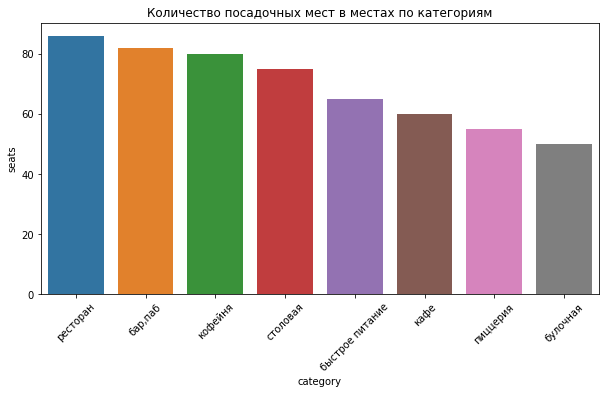

In [25]:
ax = sns.barplot(x='category', y='seats', data=data_seats)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45); # настройка направления текста по оси х
ax.figure.set_figwidth(10) # настройка размера графика по оси х
ax.figure.set_figheight(5) # настройка размера графика по оси у
ax.set_title('Количество посадочных мест в местах по категориям');

Найденные медианные значения показали, что самая большая посадка у ресторанов, при этом, из прошлого пункта, количество самих заведений ниже, чем у кафе. Далее у баров и пабов и кофеен.

#### Cоотношение сетевых и несетевых заведений

Рассмотрим какое количество заведений в DF является сетевыми и несетевыми.

In [26]:
print('Всего сетевых заведений в DF:', data.query('chain == 1')['name'].count())
print('Всего несетевых заведений в DF:', data.query('chain == 0')['name'].count())

Всего сетевых заведений в DF: 3203
Всего несетевых заведений в DF: 5200


In [27]:
print('Процент сетевых заведений:', '{0:.2%}'.format((data.query('chain == 1')['name'].count())/(data['name'].count())))
print('Процент несетевых заведений:', '{0:.2%}'.format((data.query('chain == 0')['name'].count())/(data['name'].count())))

Процент сетевых заведений: 38.12%
Процент несетевых заведений: 61.88%


В DF больше всего представлено несетевых заведений, более пяти тысяч. Это около 62% от общего числа заведений.

Рассмотрим каких заведений в какой категории больше.

In [28]:
# определение количества сетевых и несетевых заведений в каждой категории.
data_chain = data.groupby(['category', 'chain'], as_index = False)[['name']].count().rename(columns={'name':'counts'}).sort_values(by = 'counts', ascending = False)
display(data_chain)
print('Рассмотрение сетевых заведений')

data_chain= data_chain.merge (data_category, on='category', how='left')
data_chain['ratio']= (data_chain['counts_x']/data_chain['counts_y']*100).round(1)
display(data_chain.sort_values(by = 'counts_y', ascending = False))



,category,chain,counts
6,кафе,0,1598
12,ресторан,0,1313
7,кафе,1,779
13,ресторан,1,729
9,кофейня,1,720
8,кофейня,0,693
0,"бар,паб",0,596
4,быстрое питание,0,371
11,пиццерия,1,330
10,пиццерия,0,303


Рассмотрение сетевых заведений


,category,chain,counts_x,counts_y,ratio
0,кафе,0,1598,2377,67.2
2,кафе,1,779,2377,32.8
1,ресторан,0,1313,2042,64.3
3,ресторан,1,729,2042,35.7
4,кофейня,1,720,1413,51.0
5,кофейня,0,693,1413,49.0
6,"бар,паб",0,596,764,78.0
12,"бар,паб",1,168,764,22.0
8,пиццерия,1,330,633,52.1
9,пиццерия,0,303,633,47.9


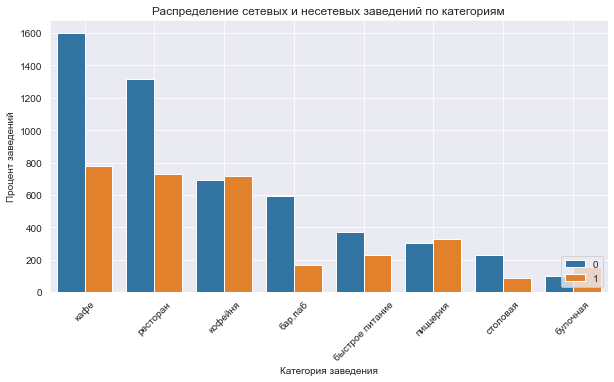

In [29]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='counts_x', data= data_chain, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Процент заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

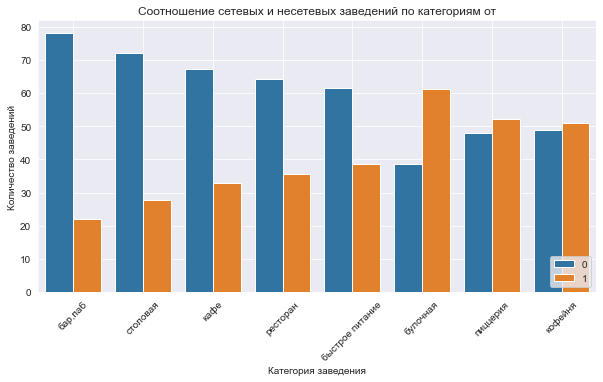

In [30]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='ratio', data= data_chain.sort_values(by = 'ratio', ascending = False), hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Cоотношение сетевых и несетевых заведений по категориям от')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()


Больше всего несетевых заведений содержат категории "кафе" и "рестораны". В отношении сетевых - ситуация идентичная. 

#### Топ-15 популярных сетей в Москве

In [31]:
data_name_top= data.query('chain == 1') #срез по сетям

Топ-15 сетей логичнее всего рассмотреть с точки зрения рейтинга. Но есть вероятность того, что рейтинг у топ-15 будет одинаков и близок к самой высшей оценке из-за большого числа различных заведений. Проверим это предположение.

In [32]:
print(data_name_top['rating'].unique()) #уникальные значения рейтинга для проверки наличия выбросов и определения шкалы оценки

[5.  4.8 4.4 4.3 4.7 4.  4.2 4.1 3.8 3.6 3.9 3.7 4.9 4.5 3.5 2.9 3.3 3.
 4.6 2.3 3.2 2.2 2.  3.1 2.7 2.6 1.4 1.1 3.4 2.8 1.7 2.5 1.8 2.4 1.9 1.
 1.6 1.3]


Найдем заведения с самым высоким рейтингом

In [33]:
data_name_top_rating= data_name_top.groupby(['name'])['rating'].median().reset_index().sort_values(by = 'rating', ascending = False)
display(data_name_top_rating.head(15))

,name,rating
424,ЛА ГАТТА,4.9
221,ZАМАНИЯ,4.9
398,КОМ 1989,4.9
243,БАКУ,4.9
552,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,4.9
207,WE CIDRERIA,4.9
248,БАРБАРИСТА,4.9
506,ОШ,4.9
16,BIGСУШИ,4.9
20,BOSTON SEAFOOD & BAR,4.9


Как и предполагалось у всех пятнадцати заведений рейтинг одинаковый. Посмотрим какое количество открытых точек у каждой из сети, что бы понять на основании чего строился общий рейтинг сети. Дополнительно выведем еще необходимую информацию.

In [34]:
data_name_top_rating= data_name_top.groupby('name', as_index=False).agg({'rating':'median', 'chain': 'count'}).sort_values(by = 'rating', ascending = False)
display(data_name_top_rating.head(15))


,name,rating,chain
424,ЛА ГАТТА,4.9,3
221,ZАМАНИЯ,4.9,6
398,КОМ 1989,4.9,2
243,БАКУ,4.9,1
552,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,4.9,1
207,WE CIDRERIA,4.9,2
248,БАРБАРИСТА,4.9,2
506,ОШ,4.9,3
16,BIGСУШИ,4.9,1
20,BOSTON SEAFOOD & BAR,4.9,2


Довольно высокий рейтинг можно объяснить сравнительно маленьким количеством заведений, поэтому результат определения рейтинга сложно назвать адекватным. Кроме того, в некоторых открытых источниках указано, что сеть это более трех заведений под одним названием и с одним владельцев. Вероятно, некоторые заведения из топ-15 имеют еще точки, но за пределами Москвы, либо это новая сеть, в которой, на момент сбора информации, есть заведения в процессе открытия.  
Еще один из вариантов, которым можно объяснить одно заведение при отметке, что оно принадлежит сети, это разные названия от места к места внутри этой сети. Данное явление может быть "фишкой" такой сети. 
Тем не менее, все предположения требуют дополнительной информации и новых определенных исследований.

На топ-15 можно посмотреть с другой стороны. Если заведений в сети много, то вероятно это выгодно. Люди его посещают, людям нравится заведение, посетителей становится больше, значит сеть становится популярной - сеть растет. 

Найдем самые больше сети в Москве, определим их рейтинг и обозначим категорию.

In [35]:
data_name_top_count= data_name_top.groupby(['name', 'category'], as_index=False).agg({'rating':'median', 'chain': 'count'}).sort_values(by = 'chain', ascending = False)
display(data_name_top_count.head(15))

,name,category,rating,chain
1129,ШОКОЛАДНИЦА,кофейня,4.2,119
499,ДОМИНО'С ПИЦЦА,пиццерия,4.2,76
492,ДОДО ПИЦЦА,пиццерия,4.3,74
205,ONE PRICE COFFEE,кофейня,4.2,71
1145,ЯНДЕКС ЛАВКА,ресторан,4.0,69
72,COFIX,кофейня,4.1,65
241,PRIME,ресторан,4.2,49
620,КОФЕПОРТ,кофейня,4.2,42
635,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,4.4,39
966,ТЕРЕМОК,ресторан,4.1,36


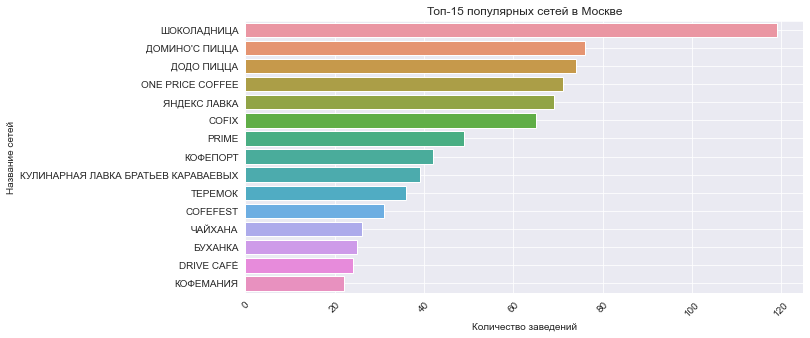

In [36]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='chain', y='name', data= data_name_top_count.head(15))#, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название сетей')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

При выделении топ-15 по количеству заведений в сети, рейтинг лидеров стал значительно ниже, от 4.0 до 4.4. У самой большой сети "Шоколадницы" рейтинг 4.2. Средний результат среди всех. Самый высокий рейтинг, 4.4, среди топ-15 у сетей: Кулинарная лавка братьев Караваевых, Буханка, Кофемания.

In [37]:
data_filtr = data_name_top_count.head(15)
#display(data_filtr)

sum_cat = data_filtr.groupby('category')['name'].count().sum()

data_filtr_cat=data_filtr.groupby('category')['name'].count().reset_index()
data_filtr_cat['ratio']=(data_filtr_cat['name']/sum_cat*100).round(1)
display(data_filtr_cat)

,category,name,ratio
0,булочная,1,6.7
1,кафе,3,20.0
2,кофейня,6,40.0
3,пиццерия,2,13.3
4,ресторан,3,20.0


In [38]:
# поспроение круговой диаграммы для быстрого визуьного восприятия лидирующих категорий
fig = go.Figure(data=[go.Pie(labels= data_filtr_cat['category'], # указываем значения, которые появятся на метках сегментов
                             values= data_filtr_cat['name'], # указываем данные, которые отобразятся на графике
                             pull = [0, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество заведений в каждой категории', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

В топ-15 попали пять категорий: булочная, пиццерия, ресторан, кафе и кофейня. Исходя из количества заведений в каждой категории, можно сделать вывод, что самой популярной категорией является кофейня -40%. 

#### Распределение заведений по районам Москвы

In [39]:
print(data['district'].unique())
print()
print('Всего районов:', data['district'].nunique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']

Всего районов: 9


Все заведения распределены по 9 административным районам Москвы. Рассмотрим какой количество заведений в каждом из них.

In [40]:
data_district= data.groupby('district',  as_index=False)['name'].count().rename(columns={'name':'counts'})
display(data_district.sort_values(by = 'counts', ascending = False))

,district,counts
5,Центральный административный округ,2242
2,Северный административный округ,899
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


Самое большое количество заведений общественного питания сосредоточено в Центральном административном округе. Далее, Серевный и Южный округа. Меньше всего - в Северо-Западном административном округе. Это значение почти в 5 раз меньше лидера. Судя по получившимся данным, заведения в Москве распределено равномерно, за исключением Центрального и Северо-Западного округов. 

In [41]:
data_district= data.groupby(['district','category'], as_index=False)['name'].count().rename(columns={'name':'counts'})
display(data_district)

,district,category,counts
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


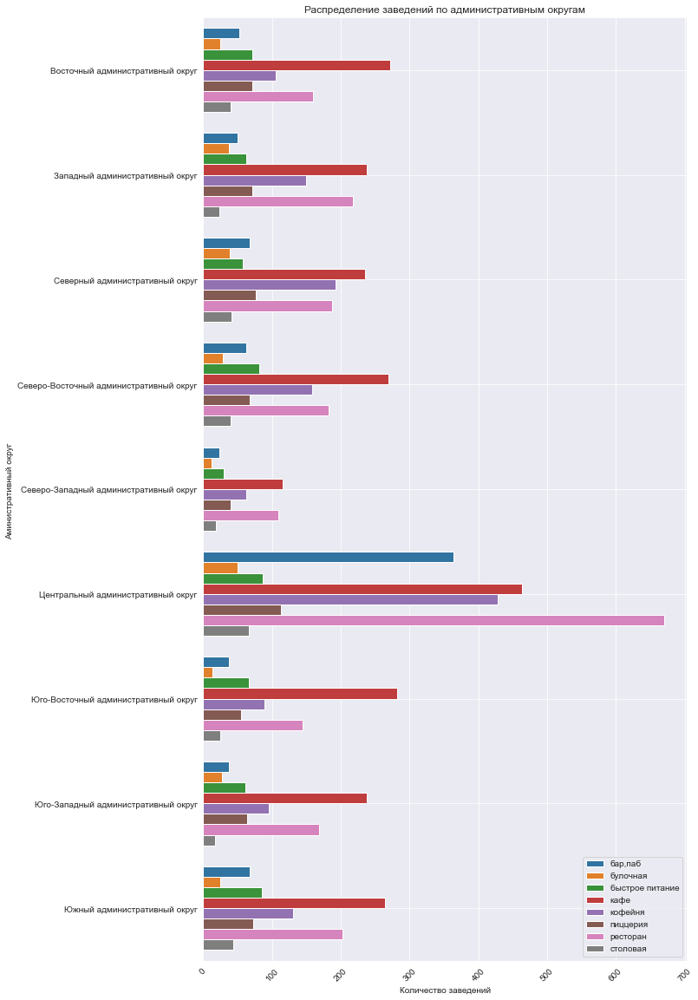

In [42]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 20))
# строим столбчатый график средствами seaborn
sns.barplot(x='counts', y='district', data= data_district, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по административным округам')
plt.xlabel('Количество заведений')
plt.ylabel('Аминистративный округ ')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [43]:
data_district = data.groupby(['district', 'category'])['name'].count().reset_index().sort_values(by = 'category').rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
data_district

#data_district = data_district.groupby('district')['count'].sum().sort_values(ascending = False).to_frame().reset_index()
#data_district

fig = px.bar(data_district, x='district', y='count', color='category', title='Распределение заведений по категориям и по районам', height=1000, width=1000)
#fig.set_size_inches(18.5, 10.5)

fig.show()

На настоящем графике видно каких заведений общественного питания больше в том или ином районе Москвы. На основании полученной диаграммы можно сделать вывод, что в Центральном районе сосредоточена больше всего заведений всех категорий. 
Во всех административных округах основную часть общепита составляют кафе. В Центральном- рестораны обогнали кафе.

#### Средний рейтинг по категориям.

In [44]:
data_rating= data.groupby(['category'])['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False).round(1)
display(data_rating.head(10))

,category,rating
0,"бар,паб",4.4
5,пиццерия,4.3
6,ресторан,4.3
4,кофейня,4.3
1,булочная,4.3
7,столовая,4.2
3,кафе,4.1
2,быстрое питание,4.1


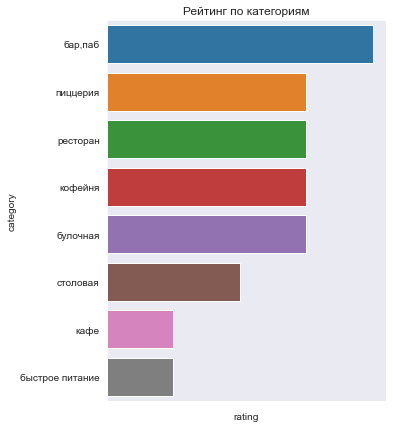

In [45]:
ax = sns.barplot( x=data_rating['rating']-4, y='category', data=data_rating)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)#, xlim=(3,5)); # настройка направления текста по оси х
ax.figure.set_figwidth(5) # настройка размера графика по оси х
ax.figure.set_figheight(7)# настройка размера графика по оси у
ax.set_title('Рейтинг по категориям');

Из таблицы и графика рейтинга категорий можно сказать, что рейтинг у всех категорий практически одинаков. Все значения рейтинга в приделах от 4.2 до 4.4.
Самый высокий рейтинг у категории бар/паб. Самый низкий у кафе и заведений быстрого питания.

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района. Средний рейтинг заведений каждого района.

In [46]:
data_district_rating= data.groupby(['district'])['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False).round(1)
display(data_district_rating.head(10))

,district,rating
5,Центральный административный округ,4.4
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
8,Южный административный округ,4.2
1,Западный административный округ,4.2
0,Восточный административный округ,4.2
7,Юго-Западный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В Центральном округе самый высокий рейтинг. Это можно объяснить тем, что в центр Москвы обладает самым большим числом заведений и им эти заведения там максимально разнообразны.

#### Отображение всех заведений датасета на карте Москвы

Нанесем на карту Москвы все заведения, которые представлены на исследовании

In [48]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

####  Топ-15 улиц по количеству заведений

Выведем топ-15 улиц, что бы посмотреть, где больше всего находится заведений общепита. 

In [49]:
data_top_street_1=data.pivot_table(index=['street'], values=['name'], aggfunc='count').sort_values(by='name', ascending=False).rename(columns={'name':'counts'})
data_top_street_1 = data_top_street_1.reset_index() # сброс индексации
display(data_top_street_1.head(15))

,street,counts
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Больше всего заведений располагается на проспекте Мира, Профсоюзной улице и проспекте Вернадского. Данные улицы очень протяженные (Профсоюзная улица входит в топ самых длинных улиц в Москве) и, вероятно, такое количество можно связать именно с этим фактором. Проверим к каким округам относятся эти улицы.

In [50]:
data_top_street=data.pivot_table(index=['street', 'district'], values=['name'], aggfunc='count').sort_values(by='name', ascending=False).rename(columns={'name':'counts'})
data_top_street = data_top_street.reset_index() # сброс индексации
display(data_top_street.head(15))

,street,district,counts
0,проспект Мира,Северо-Восточный административный округ,131
1,Профсоюзная улица,Юго-Западный административный округ,122
2,Ленинградский проспект,Северный административный округ,95
3,проспект Вернадского,Западный административный округ,95
4,Каширское шоссе,Южный административный округ,77
5,Варшавское шоссе,Южный административный округ,76
6,Ленинградское шоссе,Северный административный округ,70
7,Ленинский проспект,Юго-Западный административный округ,66
8,Дмитровское шоссе,Северный административный округ,65
9,Люблинская улица,Юго-Восточный административный округ,60


После выведения принадлежности улиц округам, топ-15 незначительно изменился. Вероятно есть улицы/проспекты, которые относятся к нескольким районам. Интересно, что данный улицы не находятся в Центральном округе, всего две. Из них проспект Мира, который и так является лидером, но в другом районе города.

Рассмотрим заведения каких категорий есть на улицах из топ-15.

In [51]:
data_top_street_cat = data.pivot_table(index = 'street', columns='category', values= 'name', aggfunc='count')

data_top_street_cat = data_top_street_cat.reset_index() # сброс индексации

data_top_street_cat = data_top_street_1.merge(data_top_street_cat, on='street', how='left')

display(data_top_street_cat.head(15))

data_top_street_cat= data_top_street_cat.head(15)

street = data_top_street_cat['street']

data_top_street_cat_1 = data.groupby(['street', 'category'])['name'].count().reset_index().sort_values(by = 'category').rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
data_top_street_cat_1 = data_top_street_cat_1.query('street in @street')
data_top_street_cat_1.sort_values(by='count', ascending=False)

,street,counts,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,183,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,122,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,108,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,107,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,95,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,88,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,77,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,76,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,70,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,65,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


,street,category,count
2860,проспект Мира,кафе,53
1380,МКАД,кафе,45
2863,проспект Мира,ресторан,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1383,МКАД,столовая,1
1365,Люблинская улица,пиццерия,1
1378,МКАД,"бар,паб",1
2843,проспект Вернадского,булочная,1


In [52]:
fig = px.bar(data_top_street_cat_1, x='street', y='count', color='category', title='Распределение заведений по категориям и по районам', height=1000, width=1000)
fig.show()

В полученной таблице видно, что заведения не всех категорий есть на улицах-лидерах. Например, на Каширском шоссе нет булочной. Возможно ее нет, просто потому что никто не пытался продавать там булочки, а возможно все открытые ранее булочные были закрыты из-за не востребованности. При вложении в какой-то проект по разворачиванию точек общепита хорошо бы дополнительно иметь данные о заведениях хотя бы за 2-3 года, чтобы посмотреть динамику запуска новых мест общепита.

#### Улицы, на которых находится только один объект общепита

In [53]:
data_one_on_street = data.groupby('street').agg({'name':'count'}).query('name<2').reset_index()['street'] 
data_one_on_street = data.query('street in @data_one_on_street').reset_index() 
display(data_one_on_street.head(10))
print('Количество улиц:', data_one_on_street['street'].nunique())
print('Количество улиц:', data_one_on_street['street'].unique())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,15,ДОМ ОБЕДА,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
1,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
2,25,В ПАРКЕ ВКУСНЕЕ,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
3,58,COFFEEKALDI'S,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
4,60,ЧЕБУРЕЧНАЯ ИСТОРИЯ,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
5,64,TESTO МАНИЯ,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,Лианозовский парк культуры и отдыха,False
6,71,COFEFEST,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,Новгородская улица,False
7,73,ВЕРАНДА,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,парк Алтуфьево,False
8,97,ЖИГУЛЕВСКОЕ,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False
9,103,ТЕТРИ,быстрое питание,"Москва, Лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,средние,Средний счёт:150–250 ₽,200.0,NaN,0,NaN,Лианозовский проезд,False


Количество улиц: 458
Количество улиц: ['улица Бусиновская Горка' 'Прибрежный проезд' 'парк Левобережный'
 'Угличская улица' 'ландшафтный заказник Лианозовский'
 'Лианозовский парк культуры и отдыха' 'Новгородская улица'
 'парк Алтуфьево' 'Бибиревская улица' 'Лианозовский проезд'
 'Челобитьевское шоссе' 'Костромская улица' 'Проектируемый проезд № 5265'
 'улица 800-летия Москвы' 'парк Ангарские Пруды' 'Вагоноремонтная улица'
 'Мурановская улица' 'улица Конёнкова' 'улица Грекова' 'Чермянский проезд'
 'парк Этнографическая деревня Бибирево' 'Челюскинская улица'
 'Таёжная улица' 'Парусный проезд' 'Светлогорский проезд'
 'Валдайский проезд' 'Пулковская улица' '3-й Лихачёвский переулок'
 'Талдомская улица' '3-й Михалковский переулок' 'парк Дружбы'
 'проезд Донелайтиса' 'Новопоселковая улица' 'Новая улица'
 'Клинская улица' 'Коптевский бульвар д 18 А стр 1' 'улица Кашёнкин Луг'
 'Северный бульвар' 'Отрадный проезд' 'Верхнелихоборская улица'
 'улица Комдива Орлова' 'Грузинский сквер' 'Путевой п

На первый взгляд улицы, на которых всего по одному заведению - небольшие улицы, проезды, переулки. 

In [54]:
data_filter=data_one_on_street.groupby('district')['street'].count().reset_index().sort_values(by = 'street', ascending = False).rename(columns={'street':'street_counts'})
display(data_filter)

,district,street_counts
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


После определения принадлежности улиц к округам, стало понятно, что большая часть улиц находятся в центре города. Возможно эти улицы именно в старом историческом центре, либо это улицы где нет большого трафика потенциальных посетителей. Это утверждение можно проверить, рассмотрев их местоположение на карте.

In [55]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_one_on_street.apply(create_clusters, axis=1)

# выводим карту
m

 На карте стало наглядно видно, что действительно больше всего маленьких улиц сосредоточено в центральной части Москвы.

#### Фоновая картограмма (хороплет) со средним чеком заведений каждого района. Средний чек заведений по районам. 

In [56]:
data_bill=data.pivot_table(index=['district'], values=['middle_avg_bill'], aggfunc='median').sort_values(by='middle_avg_bill', ascending=False)
data_bill = data_bill.reset_index() # сброс индексации
display(data_bill.head(10))

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Рассмотрев значения в `data_bill` и фоновую картограмму, получился логичный результат: средний чек выше там, где живут люди с бОльших достатком и туристические места. Самый высокий средний чек в Западном и Центральном административных округах. Кроме того, разница между двумя лидерами и третьей позицией в 300 рублей. Далее по сортировке значение среднего чека снижается более плавно. 
Еще одна закономерность: чем дальше от центра, тем ниже средний чек. Это говорит как раз об уровне достатка людей, живущих в этих районах, а так же, о не высокой востребованности таких заведений в спальных районах Москвы.

**Вывод:** В ходе основной части исследований были проработаны следующие шаги:
- определение количества посадочных мест в каждой категории;
- определение соотношения сетевых и несетевых заведений;
- определение основной категории сетевых заведений;
- определен топ-15 популярных сетей;
- определен средний рейтинг заведений по категориям;
- определен средний рейтинг заведений по районам;
- определен топ-15 улиц по количеству заведений;
- найдены улицы, на которых находится только один объект общепита;
- найден средний чек заведений в каждом районе.

Изучение файла с данными о заведениях общепита, показало, что больше всего в Москве заведений категорий кафе (2378), рестораны (2043) и кофеин (1413). Все заведения делятся на две группы сетевые и несетевые, при чем сетевых заведений меньше, около 38%.

При анализе количества посадочных мест, были определены средние значения посадки для каждой категории. Анализ показал, что самая большая посадка у ресторанов - в среднем это 86 мест. Такую большую посадку могут обеспечить только рестораны с большой площадью. Заведения таких площадей логично открывать в местах с большой проходимостью, а это вероятнее всего туристические места и центр города. Бары и пабы на втором месте – их посадка 82 места. Далее кофейни-80  посадочных мест. Для кофеин это довольно высокий показатель, с учетом того, что такая форма общепита чаще всего либо «еда на вынос», либо  быстрый перекус. Возможно такое искажение медианы связано с большим количеством пропусков в столбце с количеством посадочных мест. 

Изучение сетей общепита одна из приоритетных стадий анализа. Именно сетевые заведения являются основными конкурентами на рынке.
Чаще всего сетевыми становятся кафе, кофейни и рестораны, так как эти категории самые популярные судя по их посчитанному количеству.

Рестораны и кафе могут быть разнообразны по формату, тематике. У этих категорий больше возможностей для проявления индивидуального стиля и риторики. Кофейня распространена из-за высокой популярности кофе (из открытых источников: кофе в Москве употребляют около 64% населения).

При этом чаще всего кафе и рестораны требуют больше денежных вложений чем кофейни. Кофейни, на практике, это места быстрого перекуса или еды с собой, поэтому, возможно, не обязательно обеспечивать большую посадку даже в центре города. Хотя среднее количество посадочных мест для кофеен по Москве около 80. 

Топ-15 популярных сетей общественного питания и полученный средний рейтинг по ним стали не очень информативны. Рейтинг сетей, входящих в топ, оказался примерно одинаков, в среднем 4.3. А количество заведений внутри сетей из топ-15 от 22 до 119. Основные категории, попавшие в топ-15 булочная, пиццерия, ресторан, кафе и кофейня. 

Найденные значения среднего рейтинга заведений каждого района, показали, что и в этом случае рейтинг практически не отличается. Самый большой рейтинг – 4.4 у заведений Центрального округа. 

Топ-15 улиц по количеству заведений вывел на первые места самые большие улицы Москвы. При этом по одному заведению встречается только на маленьких улочках, проездах и т.д., т.е. в не проходимых местах.

Самый высокий средний чек в 1000 рублей оказался в Центральном и Западном административных округах. Самый низкий, 450 рублей – на Юго-Востоке Москвы.

Исходя из количества сетей в каждой категории заведений, можно сделать вывод, что самой популярной категорией, все-таки, является кофейня.


#### Шаг 4. Детализация исследования: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Необходимо определить, осуществима ли мечта клиентов.

Рассмотрим сколько кофеен в Москве и в каких районах города они расположены.

In [58]:
data_coffee = data.query('category == "кофейня"')
display(data_coffee)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В ПАРКЕ ВКУСНЕЕ,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 BAR COFFEE,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,COFEFEST,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,COFIX,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8353,НАЗИС ПУРИ,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8362,КВАДРАТ КОФЕ,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
8373,ШОКОЛАД ИМБИРЬ КОРИЦА,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8382,CAFIO,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


In [59]:
print('Всего в Москве:', data_coffee['name'].count(), 'кофеен')

Всего в Москве: 1413 кофеен


In [60]:
print('Районы расположения кофеен:', data_coffee['district'].unique())

Районы расположения кофеен: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Центральный административный округ' 'Восточный административный округ'
 'Западный административный округ' 'Юго-Восточный административный округ'
 'Юго-Западный административный округ' 'Южный административный округ']


In [61]:
data_coffee_district= data_coffee.groupby('district')['name'].count().reset_index().sort_values(by = 'name', ascending = False).rename(columns={'name':'counts'})
display(data_coffee_district)

,district,counts
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Как было ранее определено, кофеен, в рассматриваемом DF, 1413. 

Кофейни расположены во всех районах города. Основная масса находится в Центральной части и на севере. В остальных районах кофейни располагаются равномерно. 

Проверим есть ли кофейни с круглосуточным режимом работы

In [62]:
data_coffee_hours = data_coffee.query('is_24_7 == True')
print('Количество кофеен, работающих ежедневно и круглосоточно:', data_coffee_hours['name'].count())

Количество кофеен, работающих ежедневно и круглосоточно: 59


Круглосуточных заведений среди кофеен всего 59 по всей Москве.

In [63]:
data_coffee_district_rating= data_coffee.groupby(['district'])['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False).round(1)
display(data_coffee_district_rating.head(10))

,district,rating
5,Центральный административный округ,4.3
4,Северо-Западный административный округ,4.3
2,Северный административный округ,4.3
7,Юго-Западный административный округ,4.3
0,Восточный административный округ,4.3
8,Южный административный округ,4.2
6,Юго-Восточный административный округ,4.2
3,Северо-Восточный административный округ,4.2
1,Западный административный округ,4.2


In [64]:
px.box(data, y="district", x="rating")

Распределение рейтинга кофеен в зависимости от района везде одинаков, за исключением Западного административного округа. Но разница совсем не значительная и ей можно пренебречь. Считаем, что рейтинг везде 4.3.

In [65]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

In [66]:
data_coffee_cap = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
display(data_coffee_cap.sort_values(by = 'middle_coffee_cup', ascending = False))

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [67]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_cap,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино в кофейнях, с распредлением по районам',
).add_to(m)

# выводим карту
m

Самая высокая стоимость за чашку капучино в кофейнях Юго-Западного округа. Там средняя стоимость около 200 рублей. Немного дешевле в Центральном округе. Самый дешевый кофе в Восточном округе, цена за чашку капучино в среднем  135 рублей.

#### ВЫВОД

Настоящее исследование состояло из двух частей: 
    
  - анализ рынка общественного питания, в котором рассмотрены все заведения Москвы, предоставленные на анализ;
  - анализ кофеен, для определения возможности открытия в этой категории нового заведения заказчиком.

В ходе работы было выполнено:
- определение количества посадочных мест в каждой категории;
- определение соотношения сетевых и несетевых заведений;
- определение основной категории сетевых заведений;
- определен топ-15 популярных сетей;
- определен средний рейтинг заведений по категориям;
- определен средний рейтинг заведений по районам;
- определен топ-15 улиц по количеству заведений;
- найдены улицы, на которых находится только один объект общепита;
- найден средний чек заведений в каждом районе.
- анализ кофеен 

Результат исследования показал, что в Москве среди всех заведений общепита 28% кафе, 24% рестораны и 16% кофейни. Остальные категории заведений составляют менее 10% от общего числа. 

Рассмотрев среднее количество посадочных мест, определено, что рестораны имеют самую большую посадку- в среднем 86 посадочных мест. Далее бары и пабы: 82 места, после – кофейни: 80 мест.

На исследовании были сетевые и несетевые заведения. Количество сетевых оказалось, всего 38%. Сетевое распределение характерно для кафе, ресторанов и кофеен.

Для выявления основных конкурентов найдены пятнадцать популярных сетей Москвы. Топ построен двумя способами: по среднему рейтингу в сети и по количеству заведений. В итоге оказалось, что по рейтингу лидируют заведения, у которых в сети не более 6 открытых точек в Москве. Рейтинг довольно высокий - 4.9 из 5, но это не значит, что все заведения высокого уровня обслуживания, так как не известно как был получен сам рейтинг: на основании отзывов реальных посетителей, бот-накрутки или по результатам каких-либо профессиональных проверок. 

При выделении топ-15 по количеству мест рейтинг сетей получился значительно ниже- от 4.0 до  4.4. При этом количество заведений внутри сетей-лидеров не менее 22. Максимальное количество у кофейни Шоколадница – 119 точек. В топ-15 вошли 5 категорий заведений булочная, пиццерия, ресторан, кафе и кофейня. Исходя из количества заведений в каждой категории, можно сделать вывод, что самой популярной категорией является кофейня.

Для определения местоположения нового заведения заказчика, выделен топ-15 улиц, на которых располагается больше всего мест общественного питания. Самый большой выбор заведений находится на проспекте Мира. Так 183 заведения, представленных во всех восьми категориях. Однако, в списке топ-15 есть улицы, на которых нет заведений по некоторым категориям. Это можно взять во внимание при выборе места, но необходимо провести дополнительное изучение данных по этой улице/проспекту за предыдущие пару лет. Не исключено, что заполнение какой-либо отсутствующей категории новым заведением будет провальным. Возможно отсутствие, например булочной, говорит о том, что никто не пытался продавать тут булочки, а возможно все открытые ранее булочные были закрыты из-за невостребованности.

В процессе исследования изучены и улицы, где располагается только одно заведение. Основная их масса находится в центре города. Это тоже довольно привлекательный факт для выбора местоположения нового заведения. Но, опять же, необходимо провести дополнительный анализ по трафику этой улицы, стоимости аренды (она может быть высокой, поэтому заведение одно), более детально рассмотрена близость крупных офисов, учебных заведений и т.д.

Кофейня — это основная цель заказчика, поэтому часть исследования, направленная на анализ именно этой категории, показал:
- всего кофеен в Москве 1413, это 16% от общего числа заведений. 
- большая часть кофеен расположена в Центральном административном округе (428), меньше всего в Северо-Западном (62).  Центр самое популярное место и у жителей, и у туристов, поэтому такое расположение, вероятно.
- самый дорогой капучино на Юго-Западе и в Центральном округе. Стоимость около 200 рублей. В данных районах находится самое элитное жилье, поэтому такая стоимость оправдана.

**Рекомендации для открытия кофейни:**
1.	Местоположение можно выбрать любое, при дополнительном исследовании близлежащих территорий, изучении концепций соседних заведений питания, анализе трафика, стоимости аренды, наличие огромных сетей быстрого питания, таких как KFC, которых не представлено в данном DF, и т.д. Наиболее привлекательной локацией может стать Центр города, в частности улицы с одним заведением, либо Северо-Западный округ, в котором не такая высока конкуренция и довольно концептуальное и стильное место будет кстати. 
2.	Концепция самой кофейни определена заказчиков, поэтому, для максимальной ее рентабельности, необходимо определить наличие такой же или похожей кофейни, хотя бы, в районе одного округа. Если такое заведение будет единственным, например вообще в Москве, и оно будет обладать достаточным количеством посадочных мест, то вероятно его местоположение будет практически неважным, так как выбранный заказчиком стиль найдет отклик во многих фанатах сериала «Друзья». 
3.	Ценовая политика заведения должна быть определена с учетов вышесказанных факторов. В первую очередь выбор стоимости той же чашки капучино будет зависеть от уникальности заведения и от района расположения.